### For the best experience, view this notebook on nbviewer:
[Open in nbviewer](https://nbviewer.org/github/ArturKosma/Learning/blob/main/jupyter/ai_for_games/exercises_3.11.ipynb)

In [1]:
import leqanimlib
import leqmath
import numpy as np

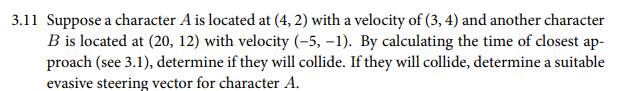

In [2]:
ex3_11 = leqanimlib.leqanimlib(xlim_max=25, ylim_max=25, title='Closest Approach', frame_num=360)

charA = ex3_11.add_object(ex3_11.Dot(np.array([4, 2], dtype=float), color='black', display_name='A'))
charB = ex3_11.add_object(ex3_11.Dot(np.array([20, 12], dtype=float), color='black', display_name='B'))

p = np.array([3, 4], dtype=float)
q = np.array([-5, -1], dtype=float)

charA.goal = leqmath.leqmath.normalize(p) * 40 + charA.pos
charB.goal = leqmath.leqmath.normalize(q) * 40 + charB.pos

charA.avoidance = True
charB.avoidance = True

# Show the closest approach point.

# Calculate the time to collision.
relative_pos = charB.pos - charA.pos
relative_vel = q - p
relative_speed = np.linalg.norm(relative_vel)
time_to_collision = np.dot(relative_pos, relative_vel) / (relative_speed * relative_speed) * -1

# Check if there's going to be a collision at all.
dist = np.linalg.norm(relative_pos)
min_separation = dist - relative_speed * time_to_collision

# min_separation means the distance from each other during the closest approach.
if min_separation <= 2 * charA.radius:
    if time_to_collision > 0:
        collision_point = charA.pos + p * time_to_collision      
        collision_obj = ex3_11.add_object(ex3_11.Dot(np.array(collision_point, dtype=float), color='red', display_name='Collision'))
        collision_obj.arrow_enabled = False

def tick_ex3_11(t):
    pass

ex3_11.draw(tick_ex3_11)